This notebook contains code related to velocity + driver behavior features
- early prediction models

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.gaussian_process.kernels import RBF, Matern, RationalQuadratic

from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
from sklearn.model_selection import train_test_split, GridSearchCV,KFold
from sklearn.preprocessing import StandardScaler
from matplotlib_inline.backend_inline import set_matplotlib_formats
set_matplotlib_formats('retina')

from pathlib import Path
import sys

In [2]:
sys.path.append(str(Path().resolve().parent.parent))
from path_manager import VEL_MODELS, MISC_DIR, VEL_DATA_DIR, PLOT_DIR

# Model-2: Time-Resolved Velocity Mode2
- Note: Cutting the time of drive cycles from 300 to 800 seconds to predict the SOC_drop at 800 second

In [3]:
velocity_soc_df = pd.read_csv(MISC_DIR / 'velocity_relative_SOC.csv')
test_df = pd.read_csv(MISC_DIR / 'velocity_relative_SOC_test_new.csv')
pd.options.mode.chained_assignment = None  # default='warn'

In [4]:
VEL_TRAIN_A1 = VEL_DATA_DIR / 'train' / 'assertive_batch1'
VEL_TRAIN_A2 = VEL_DATA_DIR / 'train' / 'assertive_batch2'
VEL_TRAIN_D1 = VEL_DATA_DIR / 'train' / 'defensive_batch1'
VEL_TRAIN_D2 = VEL_DATA_DIR / 'train' / 'defensive_batch2'

VEL_REF = VEL_DATA_DIR / 'reference'
VEL_TEST = VEL_DATA_DIR / 'test'

In [5]:
vel_def_11= pd.read_excel(VEL_TRAIN_D1 / 'speed_DR_75188.xlsx')
vel_def_12= pd.read_excel(VEL_TRAIN_D1 /'speed_DR_75053.xlsx')
vel_def_13= pd.read_excel(VEL_TRAIN_D1 / 'speed_DR_74866.xlsx')
vel_def_14= pd.read_excel(VEL_TRAIN_D1 / 'speed_DR_74789.xlsx')
vel_def_21= pd.read_excel(VEL_TRAIN_D2 / 'speed_DR_4716.xlsx')

# switch with
vel_def_22 = pd.read_excel(VEL_TRAIN_D2 / 'speed_DR_74705.xlsx')
#vel_def_22= pd.read_excel(r'drivecycles/def2/speed_DR_4832.xlsx')

vel_def_23= pd.read_excel(VEL_TRAIN_D2 / 'speed_DR_4839.xlsx')
vel_def_24= pd.read_excel(VEL_TRAIN_D2 / 'speed_DR_4840.xlsx')

# outer
#vel_asser_11 = pd.read_excel(r'drivecycles/asser1/speed_DR_74428.xlsx')
vel_asser_11= pd.read_excel(VEL_TRAIN_A1 / 'speed_DR_14634.xlsx')

# new drive cycle
# vel_asser_11= pd.read_excel(r'drivecycles/asser1/speed_DR_14634.xlsx')

vel_asser_12= pd.read_excel(VEL_TRAIN_A1 / 'speed_DR_74517.xlsx')
vel_asser_13= pd.read_excel(VEL_TRAIN_A1 / 'speed_DR_74594.xlsx')
vel_asser_14= pd.read_excel(VEL_TRAIN_A1 / 'speed_DR_74670.xlsx')
vel_asser_21= pd.read_excel(VEL_TRAIN_A2 / 'speed_DR_74765.xlsx')

# switch 
vel_asser_22 = pd.read_excel(VEL_TRAIN_A2 / 'speed_DR_4832.xlsx')
#vel_asser_22= pd.read_excel(r'drivecycles/asser2/speed_DR_74705.xlsx')

vel_asser_23= pd.read_excel(VEL_TRAIN_A2 / 'speed_DR_74674.xlsx')
vel_asser_24= pd.read_excel(VEL_TRAIN_A2 / 'speed_DR_74389.xlsx')

In [6]:
# Inputting the test drive cycles
test_def_11 = pd.read_excel(VEL_TEST / 'test_1_def.xlsx')
test_asser_11 = pd.read_excel(VEL_TEST / 'test_2_asser.xlsx')
test_def_12 = pd.read_excel(VEL_TEST / 'test_3_def.xlsx')
test_asser_12 = pd.read_excel(VEL_TEST / 'test_4_asser.xlsx')

In [7]:
vel_list=[]
vel_list.extend([vel_def_11, vel_def_12, vel_def_13, vel_def_14, 
                 vel_def_11, vel_def_12, vel_def_13, vel_def_14, 
                 vel_def_11, vel_def_12, vel_def_13, vel_def_14,
                 vel_def_21, vel_def_22, vel_def_23, vel_def_24,
                 vel_def_21, vel_def_22, vel_def_23, vel_def_24, 
                 vel_def_21, vel_def_22, vel_def_23, vel_def_24, 
                 
                 vel_asser_11, vel_asser_12, vel_asser_13, vel_asser_14, 
                 vel_asser_11, vel_asser_12, vel_asser_13, vel_asser_14, 
                 vel_asser_11, vel_asser_12, vel_asser_13, vel_asser_14, 
                 vel_asser_21, vel_asser_22, vel_asser_23, vel_asser_24, 
                 vel_asser_21, vel_asser_22, vel_asser_23, vel_asser_24, 
                 vel_asser_21, vel_asser_22, vel_asser_23, vel_asser_24, 
                 
                 vel_def_11, vel_def_12, vel_def_13, vel_def_14, 
                 vel_def_11, vel_def_12, vel_def_13, vel_def_14, 
                 vel_def_11, vel_def_12, vel_def_13, vel_def_14,
                 vel_def_21, vel_def_22, vel_def_23, vel_def_24,
                 vel_def_21, vel_def_22, vel_def_23, vel_def_24, 
                 vel_def_21, vel_def_22, vel_def_23, vel_def_24, 
                 
                 vel_asser_11, vel_asser_12, vel_asser_13, vel_asser_14, 
                 vel_asser_11, vel_asser_12, vel_asser_13, vel_asser_14, 
                 vel_asser_11, vel_asser_12, vel_asser_13, vel_asser_14, 
                 vel_asser_21, vel_asser_22, vel_asser_23, vel_asser_24, 
                 vel_asser_21, vel_asser_22, vel_asser_23, vel_asser_24, 
                 vel_asser_21, vel_asser_22, vel_asser_23, vel_asser_24
                ])

In [8]:
# Create a list of the test drive cycles
vel_test = []
vel_test.extend([test_def_11, test_def_12, test_def_11, 
                 test_def_12, test_def_11, test_def_12,
                 test_asser_11, test_asser_12, test_asser_11,
                 test_asser_12, test_asser_11, test_asser_12
])

In [9]:
# Define a function for cutting time-resolved velocity data
def cut_time(timeseries, start_time, end_time):
    return timeseries[(timeseries['time'] >= start_time) & (timeseries['time'] <= end_time)].copy()

In [10]:
#vel_dict

In [11]:
# Create the dictionary of DataFrames from the 96 input drive cycles
vel_dict = {v_d: vel_list[v_d-1] for v_d in range(1, 97)}

# Define the time intervals for cutting the data from 0 ~ 800 seconds with 50 seconds increments
time_intervals = [(300, 350), (300, 400), (300, 450), (300, 500), (300, 550), (300, 600), (300, 650), (300, 700), (300, 750), (300, 800)]

# Create a dictionary to store the cut datasets
cut_data_dicts = {f"{start}_{end}": {} for start, end in time_intervals}

# Cutting the velocity data into the defined intervals
for key in vel_dict.keys():
    for start, end in time_intervals:
        cut_data_dicts[f"{start}_{end}"][key] = cut_time(vel_dict[key], start, end)

In [12]:
# Create the dictionary of DataFrames for the testing dataset
vel_dict_test = {v_d: vel_test[v_d-1] for v_d in range(1, 13)}

# Create a dictionary to store the cut datasets for the testing data
cut_data_dicts_test = {f"{start}_{end}": {} for start, end in time_intervals}

# Cutting the velocity data into the defined intervals for the testing dataset
for key in vel_dict_test.keys():
    for start, end in time_intervals:
        cut_data_dicts_test[f"{start}_{end}"][key] = cut_time(vel_dict_test[key], start, end)

# # Check the first element in the cut dictionary for a specific interval 
# first_cut_test_element = cut_data_dicts_test["300_350"][1]
# print(first_cut_test_element)


In [13]:
# Add the cycle number list with 96 cycles
cycle_numbers = [1, 2, 3, 4] * 12 + [1, 5, 6, 7] * 12

# Create the cycle number list with 96 cycles
cycle_numbers_test =  [1, 5, 6, 7] * 3

In [14]:
vel_info = pd.DataFrame({'Mini_trip': range(1, 97)})

# Add the 'Relative_SOC_drop (%)' column and other classification features to vel_info DataFrame
vel_info['Driver'] = velocity_soc_df['Driver Type']
vel_info['Terrain'] = velocity_soc_df['Terrain']
vel_info['Method'] = velocity_soc_df['Method']
vel_info['Cycle'] = cycle_numbers
vel_info['Cell_number'] = velocity_soc_df['Battery_type']
vel_info['Drive_position'] = cycle_numbers

vel_info['Relative_SOC_drop (%)'] = velocity_soc_df['Relative_SOC_drop (%)']

In [15]:
###Testing dataset
vel_info_test = pd.DataFrame({'Mini_trip': range(1, 13)})

# Add the 'Relative_SOC_drop (%)' column from the time-resolved velocity input 
vel_info_test['Relative_SOC_drop (%)'] = test_df['Relative_SOC_drop (%)']
vel_info_test['SOC_drop (%)'] = test_df['SOC_drop (%)']

# Add other features based on the entire trip's classification for early prediction
vel_info_test['Driver_Type'] = test_df['Driver Type']
vel_info_test['Terrain'] = test_df['Terrain']
vel_info_test['Method'] = test_df['Method']

# Add the cycle numbers to the vel_info_test dataframe
vel_info_test['Drive_position'] = cycle_numbers_test
 
# Add the Battery_type to the vel_info_test dataframe
vel_info_test['Cell_number'] = test_df['Channels']

In [16]:
### Feature extraction from the input velocity files
def extract_max_velocity(timeseries):
    max_velocity = timeseries["speed"].max()
    return max_velocity

def extract_mean_velocity(timeseries):
    mean_velocity = timeseries["speed"].mean()
    return mean_velocity

# Higher variability in speed means higher std(standard deviation) often suggests 
# more aggressive or incocnsistent driving patterns, which may lead to higher consumptions
def extract_std_velocity(timeseries):
    std_velocity = timeseries["speed"].std()
    return std_velocity

# Calculate the total distance traveled using the trapezoidal rule for integration
def extract_total_distance(timeseries):
    total_distance = np.trapz(timeseries["speed"], timeseries["time"])
    return total_distance

# Calculate mean, max, min, and standard deviation of acceleration.
def extract_acceleration_metrics(timeseries):
    timeseries['acceleration'] = timeseries["speed"].diff() / timeseries["time"].diff()
    mean_acceleration = timeseries['acceleration'].mean()
    max_acceleration = timeseries['acceleration'].max()
    std_acceleration = timeseries['acceleration'].std()
    return mean_acceleration, max_acceleration, std_acceleration

# Calculate the total time spent accelerating > 0.2 m/s^2 
def extract_time_spent_accelerating(timeseries):
    # Calculate acceleration
    timeseries['acceleration'] = timeseries["speed"].diff() / timeseries["time"].diff()
    
    # Filter positive accelerations and corresponding time differences
    accelerating_intervals = timeseries['acceleration'] > 0.2
    time_differences = timeseries['time'].diff() #time intervals
    
    # Calculate the total time spent accelerating
    time_spent_accelerating = time_differences[accelerating_intervals].sum() # only sum for value > 0
    return time_spent_accelerating
    
# Calculate the total time spent decelerating < -0.16 m/s^2 
def extract_time_spent_decelerating(timeseries):
    # Calculate acceleration
    timeseries['acceleration'] = timeseries["speed"].diff() / timeseries["time"].diff()
    # Filter negative accelerations and corresponding time differences
    decelerating_intervals = timeseries['acceleration'] < -0.16
    time_differences = timeseries['time'].diff() #time intervals
    # Calculate the total time spent decelerating
    time_spent_decelerating = time_differences[decelerating_intervals].sum() # only sum for value < 0
    return time_spent_decelerating

# Extract the maximum deceleration from the timeseries.
def extract_max_deceleration(timeseries):
    timeseries['acceleration'] = timeseries["speed"].diff() / timeseries["time"].diff()
    max_deceleration = timeseries['acceleration'].min()
    return max_deceleration

# Extract the mean deceleration from the timeseries.
def extract_mean_deceleration(timeseries):
    timeseries['acceleration'] = timeseries["speed"].diff() / timeseries["time"].diff()
    # Filter deceleration values (negative acceleration)
    mean_deceleration = timeseries[timeseries['acceleration'] < 0]['acceleration'].mean() 
    return mean_deceleration

# Function counts the velocity peaks.
def extract_number_of_velocity_peaks(timeseries):
    # Calculate the first difference of velocity
    velocity_diff = timeseries["speed"].diff()

    # Identify positive peaks (speed increases then decreases)
    positive_peaks = (velocity_diff.shift(-1) < 0) & (velocity_diff > 0)
    
    # Identify negative peaks (velocity decreases then increases)
    negative_peaks = (velocity_diff.shift(-1) > 0) & (velocity_diff < 0)
    # Combine both conditions to count all peaks
    all_peaks = positive_peaks | negative_peaks

    number_of_velocity_peaks = all_peaks.sum()
    return number_of_velocity_peaks

# Calculate the average velocity during velocity peaks.
def extract_average_velocity_during_peaks(timeseries):
    peak_velocitys = timeseries["speed"][(timeseries["speed"].diff().shift(-1) < 0) & (timeseries["speed"].diff() > 0)]
    average_velocity_during_peaks = peak_velocitys.mean()
    return average_velocity_during_peaks
    

# Count the time period for constant velocity
def extract_time_spent_constant_velocity(timeseries):
    # Calculate acceleration
    timeseries['acceleration'] = timeseries["speed"].diff() / timeseries["time"].diff()
    
    # Filter intervals with acceleration close to zero and corresponding time differences
    constant_velocity_intervals = timeseries['acceleration'].abs() < 0.01
    time_differences = timeseries['time'].diff()
    
    # Calculate the total time spent at constant velocity
    time_spent_constant_velocity = time_differences[constant_velocity_intervals].sum()
    
    return time_spent_constant_velocity


# Additional time-dependent features
def extract_time_to_max_velocity(timeseries):
    max_velocity_time = timeseries.loc[timeseries["speed"].idxmax(), "time"]
    return max_velocity_time

def extract_time_to_mean_velocity(timeseries):
    mean_velocity = timeseries["speed"].mean()
    mean_velocity_time = timeseries.loc[(timeseries["speed"] - mean_velocity).abs().idxmin(), "time"]
    return mean_velocity_time

def extract_end_velocity(timeseries):
    end_velocity = timeseries["speed"].iloc[-1]
    return end_velocity

def extract_time_to_half_max_velocity(timeseries):
    max_velocity = timeseries["speed"].max()
    half_max_velocity_time = timeseries[timeseries["speed"] >= max_velocity / 2].iloc[0]["time"]
    return half_max_velocity_time

def extract_median_acceleration(timeseries):
    timeseries['acceleration'] = timeseries["speed"].diff() / timeseries["time"].diff()
    median_acceleration = timeseries['acceleration'].median()
    return median_acceleration

def extract_median_deceleration(timeseries):
    timeseries['acceleration'] = timeseries["speed"].diff() / timeseries["time"].diff()
    median_deceleration = timeseries[timeseries['acceleration'] < 0]['acceleration'].median()
    return median_deceleration

In [17]:
# Function to extract velocity-based features from the velocity timeseries
def featurize_velocity(timeseries):
    features = {}
    
    # velocity unit: m/s, and accelerations : m^2/s
    features['max_velocity'] = extract_max_velocity(timeseries)
    features['mean_velocity'] = extract_mean_velocity(timeseries)
    features['std_velocity'] = extract_std_velocity(timeseries)
    features['total_distance'] = extract_total_distance(timeseries)
    mean_accel, max_accel, std_accel = extract_acceleration_metrics(timeseries)
    features['mean_acceleration'] = mean_accel
    features['max_acceleration'] = max_accel
    features['std_acceleration'] = std_accel
    features['time_spent_accelerating'] = extract_time_spent_accelerating(timeseries)
    features['time_spent_decelerating'] = extract_time_spent_decelerating(timeseries)
    features['max_deceleration'] = extract_max_deceleration(timeseries)
    features['mean_deceleration'] = extract_mean_deceleration(timeseries)
    features['number_of_velocity_peaks'] = extract_number_of_velocity_peaks(timeseries)
    features['average_velocity_during_peaks'] = extract_average_velocity_during_peaks(timeseries)
    # features['number_of_accelerations'] = extract_number_of_accelerations(timeseries)  # count
    # features['number_of_decelerations'] = extract_number_of_decelerations(timeseries)  # count
    features['time_spent_constant_velocity'] = extract_time_spent_constant_velocity(timeseries)

    
    # Additional time-dependent features
    features['time_to_max_velocity'] = extract_time_to_max_velocity(timeseries)
    features['time_to_mean_velocity'] = extract_time_to_mean_velocity(timeseries)
    features['end_velocity'] = extract_end_velocity(timeseries)
    features['time_to_half_velocity'] = extract_time_to_half_max_velocity(timeseries)
    features['median_acceleration'] = extract_median_acceleration(timeseries)
    features['median_deceleration'] = extract_median_deceleration(timeseries)
    
    return features


In [18]:
# Initialize an empty list to store feature dictionaries for training and testing datasets
feature_dataframes = {}
feature_dataframes_test = {}

# Training Dataset Feature Extraction
for interval, cut_dict in cut_data_dicts.items():
    all_features = []
    for key in cut_dict:
        timeseries = cut_dict[key]
        features = featurize_velocity(timeseries)
        features['Mini_trip'] = key  # Add Mini_trip information
        all_features.append(features)
    df = pd.DataFrame(all_features)
    feature_dataframes[interval] = df

# Testing Dataset Feature Extraction
for interval, cut_dict_test in cut_data_dicts_test.items():
    all_features_test = []
    for key in cut_dict_test:
        timeseries = cut_dict_test[key]
        features = featurize_velocity(timeseries)
        features['Mini_trip'] = key  # Add Mini_trip information
        all_features_test.append(features)
    df_test = pd.DataFrame(all_features_test)
    feature_dataframes_test[interval] = df_test

/var/folders/20/47db4tl16cs85c5h4w_qwyt00000gn/T/ipykernel_2833/885006666.py:18: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  total_distance = np.trapz(timeseries["speed"], timeseries["time"])
/var/folders/20/47db4tl16cs85c5h4w_qwyt00000gn/T/ipykernel_2833/885006666.py:18: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  total_distance = np.trapz(timeseries["speed"], timeseries["time"])
/var/folders/20/47db4tl16cs85c5h4w_qwyt00000gn/T/ipykernel_2833/885006666.py:18: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  total_distance = np.trapz(timeseries["speed"], timeseries["time"])
/var/folders/20/47db4tl16cs85c5h4w_qwyt00000gn/T/ipykernel_2833/885006666.py:18: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` in

In [19]:
# Rename columns with corresponding unit in a formal format for each DataFrame in feature_dataframes
for interval, df in feature_dataframes.items():
    df.rename(columns={
        'max_velocity': 'Max velocity (m/s)',
        'mean_velocity': 'Mean velocity (m/s)',
        'std_velocity': 'Velocity Std Dev (m/s)',
        'total_distance': 'Total Distance (m)',
        'mean_acceleration': 'Mean Acceleration (m/s^2)',
        'max_acceleration': 'Max Acceleration (m/s^2)',
        'std_acceleration': 'Acceleration Std Dev (m/s^2)',
        'time_spent_accelerating': 'Time Spent Accelerating (s)',
        'time_spent_decelerating': 'Time Spent Decelerating (s)',
        'max_deceleration': 'Max Deceleration (m/s^2)',
        'mean_deceleration': 'Mean Deceleration (m/s^2)',
        'number_of_velocity_peaks': 'Number of velocity Peaks',
        'average_velocity_during_peaks': 'Average velocity During Peaks (m/s)',
        'time_spent_constant_velocity': 'Time Spent Constant Velocity(s)',

        # Time-dependent features
        'time_to_max_velocity' : 'Time_to_max_velocity (s)',
        'time_to_half_velocity' : 'Time_to_half_velocity (s)',
        'time_to_mean_velocity' : 'Time_to_mean_velocity (s)',
        'end_velocity': 'End Velocity (m/s)',
        'median_acceleration' : 'Median_acceleration (m/s^2)',
        'median_deceleration' : 'Median_deceleration (m/s^2)',
        
    }, inplace=True)


# Apply the same renaming to the test dataset feature dataframes
for interval, df_test in feature_dataframes_test.items():
    df_test.rename(columns={
        'max_velocity': 'Max velocity (m/s)',
        'mean_velocity': 'Mean velocity (m/s)',
        'std_velocity': 'Velocity Std Dev (m/s)',
        'total_distance': 'Total Distance (m)',
        'mean_acceleration': 'Mean Acceleration (m/s^2)',
        'max_acceleration': 'Max Acceleration (m/s^2)',
        'std_acceleration': 'Acceleration Std Dev (m/s^2)',
        'time_spent_accelerating': 'Time Spent Accelerating (s)',
        'time_spent_decelerating': 'Time Spent Decelerating (s)',
        'max_deceleration': 'Max Deceleration (m/s^2)',
        'mean_deceleration': 'Mean Deceleration (m/s^2)',
        'number_of_velocity_peaks': 'Number of velocity Peaks',
        'average_velocity_during_peaks': 'Average velocity During Peaks (m/s)',
        'time_spent_constant_velocity': 'Time Spent Constant Velocity(s)',

        # Time-dependent features
        'time_to_max_velocity' : 'Time_to_max_velocity (s)',
        'time_to_half_velocity' : 'Time_to_half_velocity (s)',
        'time_to_mean_velocity' : 'Time_to_mean_velocity (s)',
        'end_velocity': 'End Velocity (m/s)',
        'median_acceleration' : 'Median_acceleration (m/s^2)',
        'median_deceleration' : 'Median_deceleration (m/s^2)',
    }, inplace=True)

In [20]:
# Add the 'Relative_SOC_drop (%)' and other features based on the entire trip's classification for early prediction
for interval, df in feature_dataframes.items():
    df['Relative_SOC_drop (%)'] = velocity_soc_df['Relative_SOC_drop (%)']
    df['Driver_Type'] = velocity_soc_df['Driver Type']
    df['Terrain'] = velocity_soc_df['Terrain']
    df['Method'] = velocity_soc_df['Method']
    
    df['Drive_position'] = cycle_numbers
    df['Cell_number'] = velocity_soc_df['Battery_type']

# Add the 'Relative_SOC_drop (%)' and other features based on the entire trip's classification for early prediction (Testing)
for interval, df_test in feature_dataframes_test.items():
    df_test['Relative_SOC_drop (%)'] = test_df['Relative_SOC_drop (%)']
    df_test['Driver_Type'] = test_df['Driver Type']
    df_test['Terrain'] = test_df['Terrain']
    df_test['Method'] = test_df['Method']
    df_test['Drive_position'] = cycle_numbers_test
    df_test['Cell_number'] = test_df['Channels']


In [21]:
# Apply one-hot encoding to categorical features
for interval, df in feature_dataframes.items():
    df['Driver_Type'] = df['Driver_Type'].replace({1: 'Aggressive', 2: 'Normal'})
    df['Terrain'] = df['Terrain'].replace({1: 'Uphill', 2: 'Downhill', 3: 'Flat Plane'})
    df['Method'] = df['Method'].replace({1: 'Rest and Charge', 2: 'No Rest'})
    df['Drive_position'] = df['Drive_position'].replace({1: 'No Rest-1', 2: 'Rest and Charge_1', 3: 'Rest and Charge_2', 4: 'Rest and Charge_3',
                                                                              5: 'No Rest-2', 6: 'No Rest-3', 7: 'No Rest-4'})
    df['Cell_number'] = df['Cell_number'].replace({5: '1', 6: '2', 7: '3'})
    feature_dataframes[interval] = pd.get_dummies(df, columns=["Driver_Type", "Method", "Terrain", "Drive_position", "Cell_number"], 
                                                  prefix=["Driver_Type", "Method", "Terrain", "Drive_position", "Cell_number"])


# Apply one-hot encoding to categorical features for testing data
for interval, df_test in feature_dataframes_test.items():
    df_test['Driver_Type'] = df_test['Driver_Type'].replace({1: 'Aggressive', 2: 'Normal'})
    df_test['Terrain'] = df_test['Terrain'].replace({1: 'Uphill', 2: 'Downhill', 3: 'Flat Plane'})
    df_test['Method'] = df_test['Method'].replace({1: 'Rest and Charge'})
    df_test['Drive_position'] = df_test['Drive_position'].replace({1: 'No Rest-1', 2: 'Rest and Charge_1', 3: 'Rest and Charge_2', 4: 'Rest and Charge_3',
                                                                              5: 'No Rest-2', 6: 'No Rest-3', 7: 'No Rest-4'})
    df_test['Cell_number'] = df_test['Cell_number'].replace({5: '1', 6: '2', 7: '3'})
    
    df_test_encoded= pd.get_dummies(df_test, columns=["Driver_Type", "Method", "Terrain", "Drive_position", "Cell_number"], 
                                                       prefix=["Driver_Type", "Method", "Terrain", "Drive_position", "Cell_number"])
    
    # Add missing columns with all False values if they are not already present
    for col in ['Drive_position_No Rest-1', 'Drive_position_Rest and Charge_1', 'Drive_position_Rest and Charge_2', 'Drive_position_Rest and Charge_3']:
        if col not in df_test_encoded.columns:
            df_test_encoded[col] = 0

    # Update the feature_dataframes_test dictionary with the encoded DataFrame
    feature_dataframes_test[interval] = df_test_encoded
    

In [22]:
## Regression ML models
def linear_regression(df1, df2):
    X_1 = df1.drop(columns=['Relative_SOC_drop (%)'])
    y_1 = df1['Relative_SOC_drop (%)']
    X_2_test = df2.drop(columns=['Relative_SOC_drop (%)'])
    y_2_test = df2['Relative_SOC_drop (%)']

    X_1_train, X_1_test, y_1_train, y_1_test = train_test_split(X_1, y_1, test_size=0.2)
    scaler = StandardScaler()
    X_1_train_scaled = scaler.fit_transform(X_1_train)
    X_1_test_scaled = scaler.transform(X_1_test)
    X_2_test_scaled = scaler.transform(X_2_test)

    linear_model = LinearRegression()
    linear_model.fit(X_1_train_scaled, y_1_train)
    y_pred_test = linear_model.predict(X_2_test_scaled)
    mape_linear = mean_absolute_percentage_error(y_2_test, y_pred_test)
    return linear_model, mape_linear

def knn_regression(df1, df2):
    X_1 = df1.drop(columns=['Relative_SOC_drop (%)'])
    y_1 = df1['Relative_SOC_drop (%)']
    X_2_test = df2.drop(columns=['Relative_SOC_drop (%)'])
    y_2_test = df2['Relative_SOC_drop (%)']

    X_1_train, X_1_test, y_1_train, y_1_test = train_test_split(X_1, y_1, test_size=0.2)
    scaler = StandardScaler()
    X_1_train_scaled = scaler.fit_transform(X_1_train)
    X_1_test_scaled = scaler.transform(X_1_test)
    X_2_test_scaled = scaler.transform(X_2_test)

    param_grid = {'n_neighbors': range(1, 10), 'weights': ['uniform', 'distance'], 'p': [1, 2]}
    grid_search = GridSearchCV(KNeighborsRegressor(), param_grid, cv=10, scoring='neg_mean_absolute_error', n_jobs=-1)
    grid_search.fit(X_1_train_scaled, y_1_train)
    knn_model = grid_search.best_estimator_
    knn_model.fit(X_1_train_scaled, y_1_train)
    y_pred_test = knn_model.predict(X_2_test_scaled)
    mape_knn = mean_absolute_percentage_error(y_2_test, y_pred_test)
    return knn_model, mape_knn

def decision_tree_regression(df1, df2):
    X_1 = df1.drop(columns=['Relative_SOC_drop (%)'])
    y_1 = df1['Relative_SOC_drop (%)']
    X_2_test = df2.drop(columns=['Relative_SOC_drop (%)'])
    y_2_test = df2['Relative_SOC_drop (%)']

    X_1_train, X_1_test, y_1_train, y_1_test = train_test_split(X_1, y_1, test_size=0.2)
    scaler = StandardScaler()
    X_1_train_scaled = scaler.fit_transform(X_1_train)
    X_1_test_scaled = scaler.transform(X_1_test)
    X_2_test_scaled = scaler.transform(X_2_test)

    param_grid = {'max_depth': [None, 10, 20, 50], 'min_samples_split': [2, 5, 10]}
    grid_search = GridSearchCV(DecisionTreeRegressor(random_state=0), param_grid, cv=10, scoring='neg_mean_absolute_error', n_jobs=-1)
    grid_search.fit(X_1_train_scaled, y_1_train)
    decision_tree_model = grid_search.best_estimator_
    decision_tree_model.fit(X_1_train_scaled, y_1_train)
    y_pred_test = decision_tree_model.predict(X_2_test_scaled)
    mape_dt = mean_absolute_percentage_error(y_2_test, y_pred_test)
    return decision_tree_model, mape_dt

def random_forest_regression(df1, df2):
    X_1 = df1.drop(columns=['Relative_SOC_drop (%)'])
    y_1 = df1['Relative_SOC_drop (%)']
    X_2_test = df2.drop(columns=['Relative_SOC_drop (%)'])
    y_2_test = df2['Relative_SOC_drop (%)']

    X_1_train, X_1_test, y_1_train, y_1_test = train_test_split(X_1, y_1, test_size=0.2)
    scaler = StandardScaler()
    X_1_train_scaled = scaler.fit_transform(X_1_train)
    X_1_test_scaled = scaler.transform(X_1_test)
    X_2_test_scaled = scaler.transform(X_2_test)

    param_grid = {'n_estimators': [550, 600, 650], 'max_depth': [None, 10], 'min_samples_split': [2, 5]}
    grid_search = GridSearchCV(RandomForestRegressor(random_state=0), param_grid, cv=10, scoring='neg_mean_absolute_error', n_jobs=-1)
    grid_search.fit(X_1_train_scaled, y_1_train)
    rf_model = grid_search.best_estimator_
    rf_model.fit(X_1_train_scaled, y_1_train)
    y_pred_test = rf_model.predict(X_2_test_scaled)
    mape_rf = mean_absolute_percentage_error(y_2_test, y_pred_test)
    return rf_model, mape_rf

def gaussian_process_regression(df1, df2):
    X_1 = df1.drop(columns=['Relative_SOC_drop (%)'])
    y_1 = df1['Relative_SOC_drop (%)']
    X_2_test = df2.drop(columns=['Relative_SOC_drop (%)'])
    y_2_test = df2['Relative_SOC_drop (%)']

    X_1_train, X_1_test, y_1_train, y_1_test = train_test_split(X_1, y_1, test_size=0.2)
    scaler = StandardScaler()
    X_1_train_scaled = scaler.fit_transform(X_1_train)
    X_1_test_scaled = scaler.transform(X_1_test)
    X_2_test_scaled = scaler.transform(X_2_test)

    param_grid = {
        'alpha': [1e-4, 1e-3, 1e-2, 0.1, 1],
        'kernel': [
            RBF(length_scale=1.0), 
            Matern(length_scale=1.0, nu=1.5), 
            Matern(length_scale=2.0, nu=0.5)
        ],
        'normalize_y': [True, False]
    }
    gpr = GaussianProcessRegressor(random_state=0)
    grid_search = GridSearchCV(gpr, param_grid, cv=10, scoring='neg_mean_absolute_error', n_jobs=-1)
    grid_search.fit(X_1_train_scaled, y_1_train)
    gp_model = grid_search.best_estimator_
    gp_model.fit(X_1_train_scaled, y_1_train)
    y_pred_test = gp_model.predict(X_2_test_scaled)
    mape_gp = mean_absolute_percentage_error(y_2_test, y_pred_test)
    return gp_model, mape_gp

def extra_trees_regression(df1, df2):
    X_1 = df1.drop(columns=['Relative_SOC_drop (%)'])
    y_1 = df1['Relative_SOC_drop (%)']
    X_2_test = df2.drop(columns=['Relative_SOC_drop (%)'])
    y_2_test = df2['Relative_SOC_drop (%)']

    X_1_train, X_1_test, y_1_train, y_1_test = train_test_split(X_1, y_1, test_size=0.2)
    scaler = StandardScaler()
    X_1_train_scaled = scaler.fit_transform(X_1_train)
    X_1_test_scaled = scaler.transform(X_1_test)
    X_2_test_scaled = scaler.transform(X_2_test)

    param_grid = {'n_estimators': [400, 500, 600], 'max_depth': [None, 10, 20], 'min_samples_split': [2, 5]}
    grid_search = GridSearchCV(ExtraTreesRegressor(random_state=0), param_grid, cv=10, scoring='neg_mean_absolute_error', n_jobs=-1)
    grid_search.fit(X_1_train_scaled, y_1_train)
    extra_trees_model = grid_search.best_estimator_
    extra_trees_model.fit(X_1_train_scaled, y_1_train)
    y_pred_test = extra_trees_model.predict(X_2_test_scaled)
    mape_et = mean_absolute_percentage_error(y_2_test, y_pred_test)
    return extra_trees_model, mape_et

def neural_network_regressor(df1, df2):
    X_1 = df1.drop(columns=['Relative_SOC_drop (%)'])
    y_1 = df1['Relative_SOC_drop (%)']
    X_2_test = df2.drop(columns=['Relative_SOC_drop (%)'])
    y_2_test = df2['Relative_SOC_drop (%)']

    X_1_train, X_1_test, y_1_train, y_1_test = train_test_split(X_1, y_1, test_size=0.2)
    scaler = StandardScaler()
    X_1_train_scaled = scaler.fit_transform(X_1_train)
    X_1_test_scaled = scaler.transform(X_1_test)
    X_2_test_scaled = scaler.transform(X_2_test)

    param_grid = {'hidden_layer_sizes': [(50,), (100,), (50, 50)], 'activation': ['relu', 'tanh'], 'solver': ['adam', 'sgd'], 'alpha': [0.0001, 0.001, 0.01], 'learning_rate': ['constant', 'adaptive']}
    Nn_model = MLPRegressor(random_state=0, max_iter=500)
    grid_search = GridSearchCV(Nn_model, param_grid, cv=10, scoring='neg_mean_absolute_error', n_jobs=-1)
    grid_search.fit(X_1_train_scaled, y_1_train)
    Nn_model = grid_search.best_estimator_
    Nn_model.fit(X_1_train_scaled, y_1_train)
    y_pred_test = Nn_model.predict(X_2_test_scaled)
    mape_Nn = mean_absolute_percentage_error(y_2_test, y_pred_test)
    return Nn_model, mape_Nn

# Function to run the models multiple times and calculate the average and std of MAPE
def evaluate_models(df1, df2, iterations):
    results = {
        'Linear': [],
        'KNN': [],
        'Decision Tree': [],
        'Random Forest': [],
        'Gaussian Process': [],
        'Extremely Randomized Trees': [],
        'Neural Network': []
    }
    
    for _ in range(iterations):
        _, mape_linear = linear_regression(df1, df2)
        _, mape_knn = knn_regression(df1, df2)
        _, mape_dt = decision_tree_regression(df1, df2)
        _, mape_rf = random_forest_regression(df1, df2)
        _, mape_gp = gaussian_process_regression(df1, df2)
        _, mape_et = extra_trees_regression(df1, df2)
        _, mape_Nn = neural_network_regressor(df1, df2)
        
        results['Linear'].append(mape_linear)
        results['KNN'].append(mape_knn)
        results['Decision Tree'].append(mape_dt)
        results['Random Forest'].append(mape_rf)
        results['Gaussian Process'].append(mape_gp)
        results['Extremely Randomized Trees'].append(mape_et)
        results['Neural Network'].append(mape_Nn)
    
    avg_results = {model: np.mean(mapes) for model, mapes in results.items()}
    std_results = {model: np.std(mapes) for model, mapes in results.items()}
    
    return avg_results, std_results

In [23]:
feature_dataframes['300_350'].to_csv(VEL_MODELS/'velocity_forecasting_input.csv')

In [24]:
feature_dataframes_test['300_350'].to_csv(VEL_MODELS/'velocity_forecasting_input_test.csv')

In [25]:
# Evaluate models and calculate MAPE values for each time interval
iterations = 10
all_mape_values = {}

for interval, df in feature_dataframes.items():
    # Select features for the training data
    df_selected = df[[ 
                        'Total Distance (m)', 
                        'Velocity Std Dev (m/s)', 
                        'Time_to_half_velocity (s)', 
                        'Time_to_mean_velocity (s)', 

                        # One-hot encoding features
                        'Driver_Type_Aggressive',
                        'Driver_Type_Normal',
        
                        'Terrain_Downhill',
                        'Terrain_Flat Plane',
                        'Terrain_Uphill',
        
                        'Drive_position_No Rest-1',
                        'Drive_position_No Rest-2',
                        'Drive_position_No Rest-3',
                        'Drive_position_No Rest-4',
                        'Drive_position_Rest and Charge_1',
                        'Drive_position_Rest and Charge_2',
                        'Drive_position_Rest and Charge_3',
        
                        'Cell_number_1',
                        'Cell_number_2',
                        'Cell_number_3',
        
                        'Relative_SOC_drop (%)']]

    # Select corresponding features for the testing data
    df_test_selected = feature_dataframes_test[interval][[
                        'Total Distance (m)', 
                        'Velocity Std Dev (m/s)', 
                        'Time_to_half_velocity (s)', 
                        'Time_to_mean_velocity (s)', 
        
                        # One-hot encoding features
                        'Driver_Type_Aggressive',
                        'Driver_Type_Normal',
        
                        'Terrain_Downhill',
                        'Terrain_Flat Plane',
                        'Terrain_Uphill',
        
                        'Drive_position_No Rest-1',
                        'Drive_position_No Rest-2',
                        'Drive_position_No Rest-3',
                        'Drive_position_No Rest-4',
                        'Drive_position_Rest and Charge_1',
                        'Drive_position_Rest and Charge_2',
                        'Drive_position_Rest and Charge_3',
        
                        'Cell_number_1',
                        'Cell_number_2',
                        'Cell_number_3',
        
                        'Relative_SOC_drop (%)']]

    # Evaluate the models and calculate MAPE
    avg_mape, std_mape = evaluate_models(df_selected, df_test_selected, iterations)
    all_mape_values[interval] = {
        'avg': avg_mape,
        'std': std_mape
    }

/Users/hemanthnr/Library/Caches/pypoetry/virtualenvs/ev-range-anxiety-RrTLfGNy-py3.11/lib/python3.11/site-packages/sklearn/gaussian_process/_gpr.py:660: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL: .

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/Users/hemanthnr/Library/Caches/pypoetry/virtualenvs/ev-range-anxiety-RrTLfGNy-py3.11/lib/python3.11/site-packages/sklearn/gaussian_process/_gpr.py:660: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL: .

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/Users/hemanthnr/Library/Caches/pypoetry/virtualenvs/ev-range-anxiety-RrTLfGNy-py3.11/lib/python3.11/site-packages/sklearn/gaussian_process/_gpr.py:660: ConvergenceWarning: lbfgs failed to c

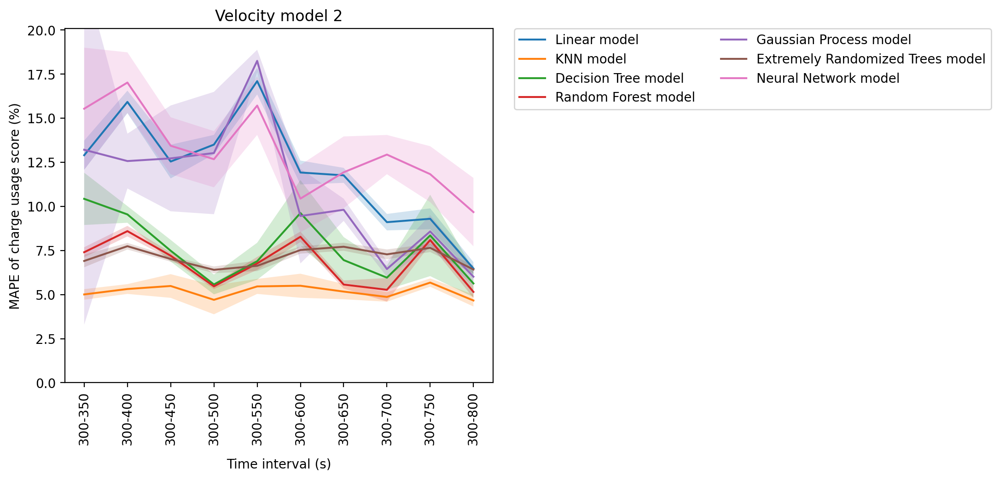

In [26]:
models = ['Linear', 'KNN', 'Decision Tree', 'Random Forest', 'Gaussian Process', 'Extremely Randomized Trees', 'Neural Network']
time_intervals = ["300-350", "300-400", "300-450", "300-500", "300-550", 
                  "300-600", "300-650", "300-700", "300-750", "300-800"]

# Define intervals based on the chosen time_intervals
intervals = [f"{start}_{end}" for start, end in [(300, 350), (300, 400), (300, 450), (300, 500), (300, 550), 
                                                 (300, 600), (300, 650), (300, 700), (300, 750), (300, 800)]]

# Initialize dictionaries to store MAPE values and their standard deviations for each model
mape_means = {model: [] for model in models}
mape_stds = {model: [] for model in models}

# Extract MAPE means and standard deviations for each model
for model in models:
    for interval in intervals:
        mape_means[model].append(all_mape_values[interval]['avg'][model] * 100)  # Convert MAPE to percentage
        mape_stds[model].append(all_mape_values[interval]['std'][model] * 100)   # Convert MAPE to percentage

# Determine the y-axis limits based on the maximum MAPE value
y_max = max([max(mape_means[model]) for model in models])

sns.reset_orig()
plt.rcdefaults()
# Plotting the MAPE trends with error bars for standard deviation to visualize the result for early prediction purpose
plt.figure(figsize=(6, 5))
for model in models:
    plt.plot(intervals, mape_means[model], label=f'{model} model')
    plt.fill_between(intervals, np.array(mape_means[model]) - np.array(mape_stds[model]), np.array(mape_means[model]) + np.array(mape_stds[model]), alpha=0.2)

plt.ylim(0, y_max * 1.1)
plt.xticks(ticks=range(len(time_intervals)), labels=time_intervals, rotation=90)

plt.xlabel("Time interval (s)", labelpad=10)
plt.ylabel("MAPE of charge usage score (%)")
plt.title("Velocity model 2")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0., ncol=2)
plt.show()

In [27]:
# Create a DataFrame with Time Intervals and MAPE values for all models
results_df = pd.DataFrame({'Time Interval': intervals})

for model in models:
    results_df[f'{model} MAPE (%)'] = mape_means[model]

# Export the DataFrame to a CSV file
results_df.to_csv(MISC_DIR/'velocity_model_2_early_prediction.csv', index=False)

print("MAPE results for all models exported to 'V_Model-2_Time-Resolved_mape_results_all_models.csv'")

MAPE results for all models exported to 'V_Model-2_Time-Resolved_mape_results_all_models.csv'
